## Car OCR Data Extraction

- Acquired used and unused car data for various states via screenshots
- Using OCR to extract the data and created a dataset

In [733]:
# Importing Libraries
from PIL import Image #using the Python Image Library (PIL) for image manipulation
import pytesseract #using pytesseract for OCR on the manipulated images
import pandas as pd #pandas for creating and manipulating data
import numpy as np #scientific calcualtion
import os
import matplotlib.pyplot as plt
import seaborn as sns

(1920, 5822)


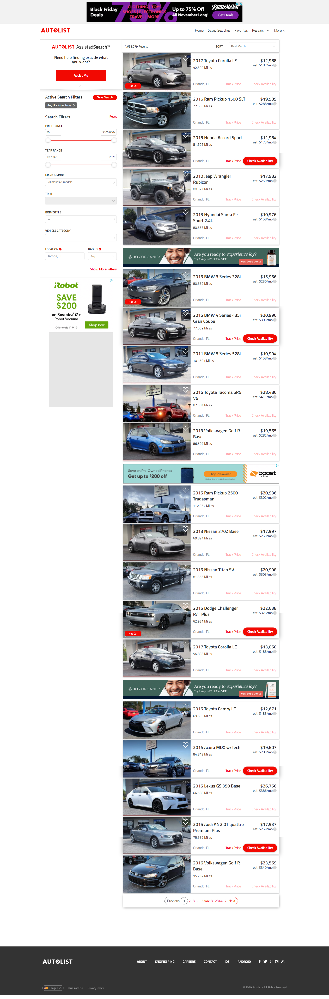

In [734]:
# The image that we need to crop individual segments
im = Image.open(r'C:\Users\vaibh\OneDrive\Desktop\VB\Python\raw_data\raw_data\Autolist\capture1.png')
print(im.size)
display(im)

AutoList - Cars Grid offsets

left = 700,
top = 300,
right = 1650,
bottom = 5225.

After 5 cars, 110 pixels skip
Rectangle length = 231

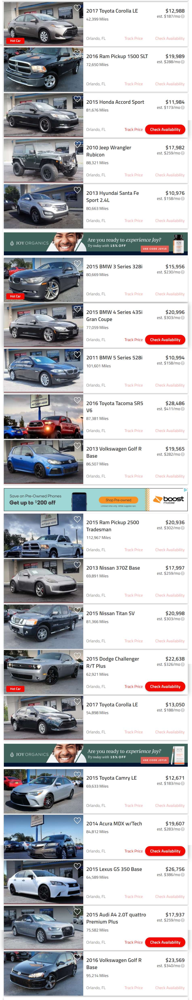

In [735]:
# Cropping the segment or container (html division) that lists the cars
left = 700
top = 300
right = 1650
bottom = 5225

im1 = im.crop((left, top, right, bottom))
display(im1)

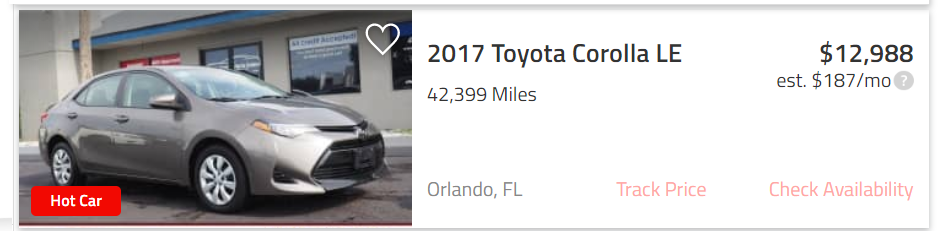

In [736]:
# Example of cropping one car
left = 700
top = 300
right = 1650
bottom = 300 + 231

im2 = im.crop((left, top, right, bottom))
display(im2)

### To assure that OCR captures all the relevant fields - converting the images to black & white to highlight the relevant fields ; assuring there is no loss of data

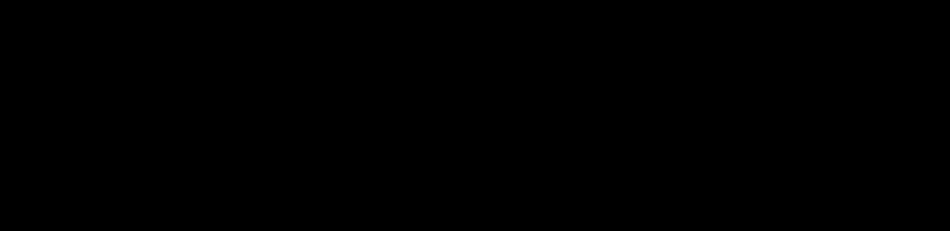

In [737]:
threshold = 255
fn = lambda x : threshold if x > threshold else 0
r = im2.convert('L').point(fn, mode='1')
display(r)
im2.save(r'C:\Users\vaibh\OneDrive\Desktop\VB\Python\raw_data\raw_data\Autolist_extracts\car1.png')

### Creating a function to leverage pytesseract for implementing converting the image to black & white and perform OCR on manipulated images  

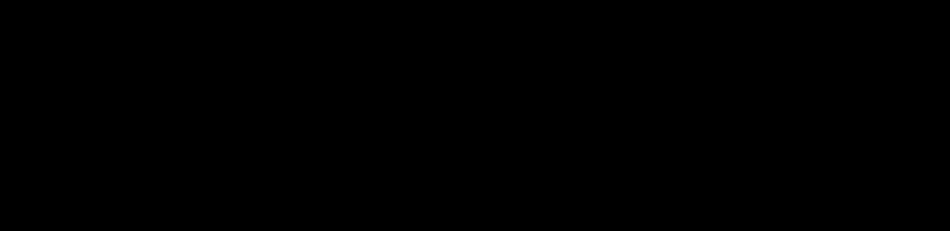

Text extracted: 


2017 Toyota Corolla LE $12,988

42,399 Miles est. $187/mo@

Orlando, FL Track Price Check Availability


In [738]:
# https://stackoverflow.com/questions/50951955/pytesseract-tesseractnotfound-error-tesseract-is-not-installed-or-its-not-i
def ocr_core(filename):
    pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'
    img= Image.open(filename)
    thresh = 245    #Converting the image to Black & White 
    fn = lambda x : 255 if x > thresh else 0
    r = img.convert('L').point(fn, mode='1')
    text = pytesseract.image_to_string(r)
    return text
display(r)
print('Text extracted: \n\n')
print(ocr_core(r'C:\Users\vaibh\OneDrive\Desktop\VB\Python\raw_data\raw_data\Autolist_extracts\car1.png'))

## Extracting vairous paramaters from OCR string   

#### Extracting Miles from the OCR string

In [739]:
astr = ocr_core(r'C:\Users\vaibh\OneDrive\Desktop\VB\Python\raw_data\raw_data\Autolist_extracts\car1.png')
count = 0  
for i in astr.lower().split():
    if(i == 'miles'):
        break
    count += 1
int(astr.split()[count - 1].replace(',',''))

42399

#### Extracting year from the OCR string

In [740]:
int(astr.split()[0])

2017

#### Extracting make from the OCR string

In [741]:
astr.split()[1].lower()

'toyota'

#### Extracting Model

In [742]:
astr.split()[2].lower()

'corolla'

#### Extracting location from the OCR string

In [743]:
astr.split('\n')[-1].replace(',','').split()[0:2]

['Orlando', 'FL']

#### Extracting price from the OCR string

In [744]:
int(astr.split('\n')[0].split()[-1].replace(',','').replace('$',''))

12988

## Creating the dataframe

In [745]:
adict = {}

In [746]:
adict['year'] = int(astr.split()[0])
adict['make'] = astr.split()[1].lower()
adict['model'] = astr.split()[2].lower()
adict['price'] = int(astr.split('\n')[0].split()[-1].replace(',','').replace('$',''))
count = 0  
for i in astr.lower().split():
    if(i == 'miles'):
        break
    count += 1
adict['miles'] =  astr.split()[count -1].replace(',','')
adict['place_state'] = str(astr.split('\n')[-1].replace(',','').split()[0:2])

In [747]:
data = pd.DataFrame(columns=['year','make','model','miles','place_state','price'])

In [748]:
data = data.append({'year':adict['year'],'make':adict['make'],'model':adict['model'],'miles':adict['miles'],'place_state':adict['place_state'],'price':adict['price']}, ignore_index=True)

In [749]:
data

,year,make,model,miles,place_state,price
0,2017,toyota,corolla,42399,"['Orlando', 'FL']",12988


### Creating a loop to crop, perform OCR and add to the dataframe  

In [750]:
os.chdir(r'C:\Users\vaibh\OneDrive\Desktop\VB\Python\raw_data\raw_data\Autolist')

In [751]:
os.listdir()

['capture1.png',
 'capture10.png',
 'capture100.png',
 'capture101.png',
 'capture102.png',
 'capture103.png',
 'capture104.png',
 'capture105.png',
 'capture106.png',
 'capture107.png',
 'capture108.png',
 'capture109.png',
 'capture11.png',
 'capture110.png',
 'capture111.png',
 'capture112.png',
 'capture113.png',
 'capture114.png',
 'capture115.png',
 'capture116.png',
 'capture117.png',
 'capture118.png',
 'capture119.png',
 'capture12.png',
 'capture120.png',
 'capture121.png',
 'capture122.png',
 'capture123.png',
 'capture124.png',
 'capture125.png',
 'capture126.png',
 'capture127.png',
 'capture128.png',
 'capture129.png',
 'capture13.png',
 'capture130.png',
 'capture131.png',
 'capture132.png',
 'capture133.png',
 'capture134.png',
 'capture135.png',
 'capture136.png',
 'capture137.png',
 'capture138.png',
 'capture139.png',
 'capture14.png',
 'capture140.png',
 'capture141.png',
 'capture142.png',
 'capture143.png',
 'capture144.png',
 'capture145.png',
 'capture146.png',


#### Task1: Crop individual cars from all the screen captures in extract folder

In [752]:
carnum = 1
for i in os.listdir():
    #Crop segments from screen shot and save them
    car = 1
    bottom = 530
    top = 300
    left = 700
    right = 1650
    
    im = Image.open(i)

    while(bottom < im.size[1]):
        try:
            im1 = im.crop((left, top, right, bottom))
            source = r'C:\Users\vaibh\OneDrive\Desktop\VB\Python\raw_data\raw_data\Autolist_extracts\car'+str(carnum)+'.png'
            im1.save(source)
            carnum += 1
            car += 1
            if(car in [6,11,16]):
                bottom = bottom + 230 + 110
                top = top + 230 + 110
            elif(car == 20):
                break
            else:
                bottom = bottom + 230
                top = top + 230
        except Exception as e:
            print(e)
            break

#### Task 2: Extract text from car images

In [753]:
os.chdir(r'C:\Users\vaibh\OneDrive\Desktop\VB\Python\raw_data\raw_data\Autolist_extracts') # changing dirctory to autolist extracts
os.listdir()

['car1.png',
 'car10.png',
 'car100.png',
 'car1000.png',
 'car1001.png',
 'car1002.png',
 'car1003.png',
 'car1004.png',
 'car1005.png',
 'car1006.png',
 'car1007.png',
 'car1008.png',
 'car1009.png',
 'car101.png',
 'car1010.png',
 'car1011.png',
 'car1012.png',
 'car1013.png',
 'car1014.png',
 'car1015.png',
 'car1016.png',
 'car1017.png',
 'car1018.png',
 'car1019.png',
 'car102.png',
 'car1020.png',
 'car1021.png',
 'car1022.png',
 'car1023.png',
 'car1024.png',
 'car1025.png',
 'car1026.png',
 'car1027.png',
 'car1028.png',
 'car1029.png',
 'car103.png',
 'car1030.png',
 'car1031.png',
 'car1032.png',
 'car1033.png',
 'car1034.png',
 'car1035.png',
 'car1036.png',
 'car1037.png',
 'car1038.png',
 'car1039.png',
 'car104.png',
 'car1040.png',
 'car1041.png',
 'car1042.png',
 'car1043.png',
 'car1044.png',
 'car1045.png',
 'car1046.png',
 'car1047.png',
 'car1048.png',
 'car1049.png',
 'car105.png',
 'car1050.png',
 'car1051.png',
 'car1052.png',
 'car1053.png',
 'car1054.png',
 'c

In [754]:
data = pd.DataFrame(columns=['year','make','model','miles','place_state','price'], index = ['place_state'])
for i in os.listdir():
    try:        
        print(ocr_core(i))
        astr = ocr_core(i)
        adict['year'] = int(astr.split()[0])
        adict['make'] = astr.split()[1].lower()
        adict['model'] = astr.split()[2].lower()
        adict['price'] = int(astr.split('\n')[0].split()[-1].replace(',','').replace('$',''))
        count = 0
        for i in range(len(astr.lower().split())):
            if(astr.lower().split()[i] == 'miles'):
                index = i
        print(index)
        adict['miles'] =  int(astr.split()[index - 1].replace(',',''))
        adict['place_state'] = str(astr.split('\n')[-1].replace(',','').split()[0:2])

        data = data.append({'year':adict['year'],'make':adict['make'],'model':adict['model'],'miles':adict['miles'],'place_state':adict['place_state'],'price':adict['price']}, ignore_index=True)
    except Exception as e:
        print(e)
        continue

2017 Toyota Corolla LE $12,988

42,399 Miles est. $187/mo@

Orlando, FL Track Price Check Availability
6
2013 Volkswagen Golf R $19,565
Base est. $282/mo@

86,507 Miles

Orlando, FL Track Price Check Availability
9
2018 Toyota Corolla SE $15,998
33,064 Miles est. $231/mo@

Melbourne, FL Track Price Check Availability
6
2017 Audi A3 2.0T quattro $18,500
Premium est. $267/mo@

26,018 Miles

Ocala, FL Track Price Check Availability
10
2018 Honda Accord EX $20,609
19,237 Miles est. $297/mo@

Ocala, FL Track Price Check Availability
6
2011 Ford F-150 XL $11,500
127,552 Miles est. $166/mo@

Ocala, FL Track Price Check Availability
6
2017 Ford Edge SEL $18,958
29,710 Miles est. $273/mo@

Ocala, FL Track Price Check Availability
6
2013 Honda Accord EX-L $10,256
v6 est. $148/mo@

95,000 Miles

 

Ocala, FL Track Price Check Availability
9
2018 Honda CR-V EX $22,994
61,311 Miles est. $331/mo@

Ocala, FL Track Price Check Availability
6
2018 Ford Mustang $20,990
EcoBoost est. $303/mo@

11,534 Mil

invalid literal for int() with base 10: '9,646'
Little Falls, NJ

54,236 Miles

Track Price

 

Check Ava
invalid literal for int() with base 10: 'Little'
Bronx, NY Track Price Check Ava

ateeerl

 

  

i, 2018 Nissan Versa SV

 

44,200 Miles
invalid literal for int() with base 10: 'Bronx,'
Massapequa, NY Track Price Check Ava

Y 2016 Acura MDX SH-AWD $2:
invalid literal for int() with base 10: 'Massapequa,'
35,358 Miles

Long Island City, NY Track Price Check Ava
invalid literal for int() with base 10: '35,358'
2018 Jeep Cherokee $16,995
Latitude est. $245/mo@

12,905 Miles

Melbourne, FL Track Price Check Availability
8
Long Island City, NY Track Price Check Ava
invalid literal for int() with base 10: 'Long'
V7] 2016 Honda Accord Sport $1:
90,348 Miles est. $202
invalid literal for int() with base 10: 'V7]'
Little Falis, NJ ‘Track Price (heck Ava

2016 Land Rover Range $3:
Rover Sport HSE Td6 est. $483
44,381 Miles
invalid literal for int() with base 10: 'Little'
Great Neck, NY Tra

invalid literal for int() with base 10: 'Online'
Pleasanton, CA Track Price Check Ava

2015 Audi Q5 2.0T quattro $1
Premium Plus est. $211
invalid literal for int() with base 10: 'Pleasanton,'
eS 2015 Audi S4 3.0T quattro $2!

Premium Plus est. $368
33,669 Miles
invalid literal for int() with base 10: 'eS'
Online Only Track Price Check Ava

 

 

  
 

i

Cel
by

   

Vol
invalid literal for int() with base 10: 'Online'
41,900 Miles est. $230

 

Online Only Track Price Check Ava
invalid literal for int() with base 10: '41,900'
2017 Kia Optima LX $

90,202 Miles est. $137
invalid literal for int() with base 10: ''
Santa Clara, CA ‘Track Price Check Ava

2013 Audi A5 2.0T quattro $1
Premium Plus est. $234
34,752 Miles
invalid literal for int() with base 10: 'Santa'
V4 2017 Volvo XC90 T6 $3:
Momentum est. $497

31,308 Miles

 

Online Only Track Price Check Ava
invalid literal for int() with base 10: 'V4'
2015 Honda Civic LX $1:
50,000 Miles est. $172

   

Online Only Track Price Check 

6
2009 Dodge Ram Pickup $12,900
1500 Laramie est. $186/mo@

175,189 Miles

Sarasota, FL Track Price Check Availability
10
2001 Mercedes-Benz C- $5,900
Class C 320 est. $85/mo@

57,404 Miles

Sarasota, FL Track Price Check Availability
10
7,161 Results SORT Best Match

 
   
 

2017 Ram Pickup 1500 Big $2
F Hern est. $303

24,163 Miles
invalid literal for int() with base 10: '7,161'
/ Phoenix, AZ Track Price Check Ava

a 44,476 Miles
invalid literal for int() with base 10: '/'
2013 Nissan 3702 Base $17,997
69,891 Miles est. $259/mo@

Orlando, FL Track Price Check Availability
6
2011 Mazda Mazda2 Sport $6,995
44,358 Miles est. $101/mo@

Melbourne, FL Track Price Check Availability
6
Peoria, AZ Track Price Check Ava

 

i, 2018 Nissan Versa SV

  

41,358 Miles
invalid literal for int() with base 10: 'Peoria,'
Phoenix, AZ Track Price Check Ava
invalid literal for int() with base 10: 'Phoenix,'
Sot 9 Oe

124,086 Miles

Peoria, AZ Track Price Check Ava

 

AAR Rite Combe wear
invalid litera

invalid literal for int() with base 10: 'Tolleson,'
Phoenix, AZ Track Price Check Ava

cal

 
  

iv 2018 Nissan Versa SV
42,389 Miles

$

est. $131
invalid literal for int() with base 10: 'Phoenix,'
Phoenix, AZ Track Price Check Ava

7 2017 Ford Expedition EL $2¢
T est. $38
invalid literal for int() with base 10: 'Phoenix,'
i, 2014 Lexus ES 350 Base
57,565 Miles
invalid literal for int() with base 10: 'i,'
Gilbert, AZ Track Price Check Ava
invalid literal for int() with base 10: 'Gilbert,'
i, 2017 Nissan Titan SV $2:

MEE 54,696 Miles est. $327

 
 

Phoenix, AZ Track Price Check Ava
invalid literal for int() with base 10: 'i,'
2018 Kia Soul + $1:

. est. $164
43,055 Miles
invalid literal for int() with base 10: '1:'
Scottsdale, AZ ‘Track Price

XLE
75,000 Miles
invalid literal for int() with base 10: 'Scottsdale,'
2017 Hyundai Accent SE $7,495
90,422 Miles est. $108/mo@

Melbourne, FL Track Price Check Availability
6
ae 2018 Nissan Altima 2.5 SL $1
84,347 Miles est. $166

Phoenix, AZ


list index out of range
2013 GMC Terrain SLE-1 $10,995
86,987 Miles est. $158/mo@

Melbourne, FL Track Price Check Availability
6
4 2014 Cadillac ELR Base
33,203 Miles

  

Sewell, NI Track Price Check Ava
invalid literal for int() with base 10: 'Base'
066 Results SORT Best Match

   
 

2020 Toyota RAV4 LE $25

New est. $430
invalid literal for int() with base 10: 'Match'
West Springfield,
MA Track Price Check Ava

2020 Toyota RAV4 LE $25

New est. $424
invalid literal for int() with base 10: 'West'
Grants Pass, OR Track Price Check Ava

i, 2020 Toyota RAV4 XLE $2:
New est. $419
invalid literal for int() with base 10: 'Grants'
Huntington Beach,
CA Track Price Check Ava

 

2020 Toyota RAV4 XLE $2!

a
invalid literal for int() with base 10: 'Huntington'
Sok pit la

 
   
   

New

East Rochester, NY Track Price Check Ava

AAD Fence ALIS
invalid literal for int() with base 10: 'Sok'
Cottonwood, AZ Track Price Check Ava

a

 

 

DATA AL OUR NORTH AX.ERICA

Sue br san PE agente Cola BE


6
invalid literal for int() with base 10: 'Edition'
2020 Hyundai Tucson $27,010
Sport est. $389/mo@

New

McKinney, TX Track Price Check Availability
6
invalid literal for int() with base 10: 'est.'
2020 Hyundai Kona SEL $20,899

New est. $301/mo@

McKinney, TX Track Price Check Availability
6
invalid literal for int() with base 10: 'New'
i, 2020 Hyundai Tucson $27,015
Sport est. $389/mo@

 
 

New

McKinney, TX Track Price entered elie
invalid literal for int() with base 10: 'i,'
2016 Ford Explorer XLT $19,762

71,782 Miles est. $285/mo@

McKinney, TX Track Price Check Availability
6
2016 Subaru Outback 2.5i $16,732
Premium est. $241/mo@

88,309 Miles

McKinney, TX Track Price Check Availability
9
2020 Hyundai Elantra SE $18,765

New est. $270/mo@

McKinney, TX Track Price Check Availability
9
invalid literal for int() with base 10: 'McKinney'
2018 Ford F-150 Platinum $55,000
22,025 Miles est. $793/mo@

Fort Worth, TX Track Price Check Availability
6
2018 Chevrolet Silverado $38,997
1

4 2018 Toyota 4Runner TRD
Off-Road
27,098 Miles

  

Dallas, TX Track Price Check Ava
invalid literal for int() with base 10: 'TRD'
2017 Nissan Rogue SL $2:

17,396 Miles est. $317
invalid literal for int() with base 10: '2:'
Limited
35,365 Miles

Price
invalid literal for int() with base 10: 'Limited'
2017 Toyota Tundra $36,895
Platinum est. $532/mo@

50,164 Miles

Melbourne, FL Track Price Check Availability
8
V4 2016 Jeep Grand Cherokee $2:
Limited est. $334

35,002 Miles

  

Dallas, TX Track Price Check Ava

Hot Car
invalid literal for int() with base 10: 'V4'
sa)

$2

est. $361
invalid literal for int() with base 10: 'sa)'

list index out of range
41,705 Miles

Dallas, TX Track Price Check Ava
invalid literal for int() with base 10: '41,705'
1,787 Results SORT Best Match

2015 Audi A3 2.0 Premium $1;
Plus TDI est. $258
61,098 Miles
invalid literal for int() with base 10: '1,787'
Dallas, TX Track Price Check Ava

Lone Star
invalid literal for int() with base 10: 'Dallas,'
Dallas, 

Columbus, OH rack Price eck Ava

Y 2015 Chrysler 200 Limited
74,542 Miles

$e

est. $12.
invalid literal for int() with base 10: 'Columbus,'
Track Price Check Ava

32,423 Miles
invalid literal for int() with base 10: 'Track'
2009 Toyota Tacoma Base $6,995

138,224 Miles est $101/mo@

Melbourne, FL Track Price Check Availability
6
Columbus, OH Track Price Check Ava

_. Y 2016 Land Rover Range $3
— Rover Sport HSE est. $57
invalid literal for int() with base 10: 'Columbus,'
7] 2016 Mazda CX-5 Touring
40,986 Miles
invalid literal for int() with base 10: '7]'
Columbus, OH Track Price Check Ava
invalid literal for int() with base 10: 'Columbus,'
2016 Chevrolet Malibu LT $1
51,584 Miles est. $216

 

Columbus, OH Track Price Check Ava
6
Dynamic

16,812 Miles
invalid literal for int() with base 10: 'Dynamic'
Columbus, OH ‘Track Price Check Ava

   
 
   

2017 Acura MDX SH-AWD $2
40,723 Miles est. $360
invalid literal for int() with base 10: 'Columbus,'
VV 2017 Jeep Compass $1
Latitude est. $

9
invalid literal for int() with base 10: 'PA'
2015 Toyota Camry LE $12,671
est. $183/mo@

69,633 Miles

Orlando, FL Track Price Cheek Availability
8
2018 Nissan LEAF S $20,990
22,644 Miles est. $303/mo@

Online Only Track Price Check Availability
6
1923 FORD T BUCKET $15,000
est. $216/mo@

Beloit, KS Track Price Check Availability
6
invalid literal for int() with base 10: 'est.'
1923 Ford T-Bucket $54,995
Roadster est. $793/mo@

Fort Worth, TX Track Price Check Availability
6
invalid literal for int() with base 10: 'est.'
Vv 1923 FORD T-BUCKET $24,949
est. $360/mo@

roadster
2,000 Miles

Pittston, PA Track Price leeoesre ellie)
invalid literal for int() with base 10: 'Vv'
1923 Ford Model T RAT $17,500
ROD ROADSTER est. $252/mo@

1 Miles

Oakdale, CA Track Price Check Availability
11
1924 Ford Model T $19,995
1Miles est. $288/mo@

Mt Zion, IL Track Price Check Availability
11
invalid literal for int() with base 10: 'IL'
1924 Rolls-Royce Silver $249,500
Ghost Pall Mall Tourer est. $3,59

invalid literal for int() with base 10: 'Charlotte,'
4 2017 Nissan Sentra SR $1!
9,289 Miles est. $231
invalid literal for int() with base 10: '1!'
Gastonia, NC Track Price Check Ava
invalid literal for int() with base 10: 'Gastonia,'
7) 2018 Nissan Versa SV $
44,531 Miles est. $135

 
 

Rock Hill, SC Track Price Check Ava
invalid literal for int() with base 10: '7)'
2015 Kia Optima LX $13

93,940 Miles est. $187
6
Gastonia, NC ‘Track Price

 
  

Y 2016 Ram Pickup 1500
Express

19,877 Miles
invalid literal for int() with base 10: 'Gastonia,'
cra

2017 Audi A4 2.0T quattro
Premium

24,584 Miles

Gastonia, NC Track Price

 

Check Ava
invalid literal for int() with base 10: 'cra'
2013 Honda CR-V LX $14,895
51,811 Miles est. $215/mo@

Melbourne, FL Track Price Check Availability
6
Class C 300 Luxury 4MATIC

32,084 Miles
invalid literal for int() with base 10: 'Class'
ae
invalid literal for int() with base 10: 'ae'
A 2017 Hyundai Tucson SE
Plus

31.54 Miles

  

Charlotte, NC Track Price

invalid literal for int() with base 10: 'El'
El Paso, TX Track Price Check Ava

7 2018 Toyota C-HR XLE
Premium est. $288

cra
invalid literal for int() with base 10: 'El'
21,082 Miles

 

El Paso, TX Track Price Check Ava

iV 2014 Chevrolet Corvette $3
invalid literal for int() with base 10: '21,082'
ingray
29,989 Miles

El Paso, TX Track Price Check Ava
invalid literal for int() with base 10: 'ingray'
El Paso, TX Track Price Check Ava
invalid literal for int() with base 10: 'El'
i, 2009 Buick Enclave CXL $1
49,711 Miles est. $216
invalid literal for int() with base 10: 'i,'
El Paso, TX rack Price eck Ava

4 2009 Kia Sedona EX
100,489 Miles
invalid literal for int() with base 10: 'El'
El Paso, TX Track Price Check Ava

 
 
 

i, 2015 Chevrolet Trax LT
48,267 Miles
invalid literal for int() with base 10: 'El'
El Paso, TX Track Price Check Ava

i, 2014 Honda Odyssey EX-L $1
62,893 Miles est. $27:
invalid literal for int() with base 10: 'El'
2009 Dodge Ram Pickup $11,995
1500 ST est. $173

invalid literal for int() with base 10: 'vv'
1925 FORD MODEL T $47,200
CUSTOM est. $680/mo@

500 Miles

Arlington, TX Track Price Check Availability
9
1925 CHRYSLER B70 Accepting
PHAETON Offers

Summerville, GA Track Price Check Availability
invalid literal for int() with base 10: 'Accepting'
Li

7, 1926 Ford Model T coupe $9,500
5,000 Miles est. $137/mo@

  

Fort Lauderdale, FL Track Price
invalid literal for int() with base 10: 'Li'
1926 Buick MASTER SIX $18,850
CLEAN TITLE est. $272/mo@
62,101 Miles

Glendale, CA Track Price Check Availability
10
2018 Jeep Grand Cherokee $37,495
Summit est. $540/mo@

29,970 Miles

Melbourne, FL Track Price Check Availability
9
1926 Ford Model T 1926 $18,000
Ford Model T Touring est $259/mo®

Burton, OH Track Price Check Availability
9
invalid literal for int() with base 10: 'T'
v 1926 Ford Model T $16,000
Runabout est. $231/mo@

 

Ete Dearborn, Ml Miced@ecee § = Check Availability
invalid literal for int() with base 10: 'v'
teas

 

 

i, 1926 For

invalid literal for int() with base 10: 'i,'
2018 Jeep Wrangler $35,164
Unlimited Sport est. $507/mo@

New

Melbourne, FL Track Price Check Availability
8
invalid literal for int() with base 10: '$507/mo@'
Woodhaven, MI

47,384 Miles

cK Price
invalid literal for int() with base 10: 'Woodhaven,'
Woodhaven, MI

108,471 Miles

Track Price

 

Check Ava
invalid literal for int() with base 10: 'Woodhaven,'
Warren, Ml Track Price Check Ava

Y 2018 Jeep Compass $1
imited est. $270
invalid literal for int() with base 10: 'Warren,'
2018 Jeep Cherokee $24
Overland est. $357

19,382 Miles
8
Warren, MI Track Price Check Ava

 

OATS CTC ee
Pete en
invalid literal for int() with base 10: 'Warren,'
0 2017 Chevrolet Equinox LT $1:
81,890 Miles est. $182

 
 

Woodhaven, MI Track Price Check Ava
invalid literal for int() with base 10: '1:'
2014 Ford Fusion SE $1

1
72,928 Miles est. $153
7
haven, MI ‘Track Price

 
  

7) 2011 Jeep Liberty Limited
86,178 Miles

$

est. $14.
invalid literal for int() 

6
2015 Ford F-150 XL $23,500
114,036 Miles est. $339/mo@

Orlando, FL Track Price Check Availability
6
2018 Nissan Versa SV $8,667
43,496 Miles est. $125/mo@

Sanford, FL Track Price Check Availability
6
2017 Ford Edge Sport $28,998

19,438 Miles est. $418/mo@

Parker, CO Track Price Check Availability
6
2017 Jeep Grand Cherokee $26,995
Overland est. $389/mo@

17,937 Miles

Melbourne, FL Track Price Check Availability
9
i, 2015 Infiniti QX70 Base $21,998

39,638 Miles est. $317/mo@

Parker, CO Track Price Check Availability
invalid literal for int() with base 10: 'i,'
2017 Nissan Titan SV $28,991

27,044 Miles est. $418/mo@
:

Parker, CO Track Price Check Availability
6
2018 Ram Pickup 1500 $39,998
Rebel est. $577/mo@

12,604 Miles

Colorado Springs, CO Track Price Check Availability
9
2016 Land Rover Range $50,998
Rover Supercharged est. $735/mo@

45,331 Miles

Parker, CO Track Price Check Availability
10
2018 Ford F-150 Platinum $38,790
| 34,566 Miles est. $559/mo@

Parker, CO Track 

7
2018 Jeep Renegade Sport $19,260

New est. $278/mo@

Melbourne, FL Track Price Check Availability
7
invalid literal for int() with base 10: 'est.'
2018 Chrysler Pacifica $22,049
Limited est. $318/mo@

46,315 Miles

Colorado Springs, CO Track Price Check Availability
8
2014 Nissan Rogue SV $13,891
75,505 Miles est. $200/mo@

Parker, CO Track Price Check Availability
6
2010 Honda CR-V EX-L $9,491
118,372 Miles est. $137/mo@

Parker, CO Track Price Check Availability
6
2018 Dodge Durango SXT $21,990
53,125 Miles est. $317/mo@

Parker, CO Track Price Check Availability
6
2016 Land Rover Range $37,998
Rover Sport HSE est. $548/mo@

39,041 Miles

Parker, CO Track Price Check Availability
11
2014 Ford Explorer Limited $20,998
78,152 Miles est. $303/mo@

Colorado Springs, CO Track Price Check Availability
6
2017 Subaru Crosstrek 2.0i $18,900
Premium est. $272/mo@

44,546 Miles

Colorado Springs, CO Track Price Check Availability
9
2016 Porsche Boxster $89,600
Spyder

est. $1,292/mo@

6,003 M

6
2018 Honda Accord $25,697
Touring est. $370/mo@

16,855 Miles

Tampa, FL Track Price Check Availability
8
2016 Hyundai Elantra SE $8,881
60,988 Miles est. $128/mo@

New Port Richey, FL Track Price Check Availability
6
2017 Kia Sportage EX $14,329
56,393 Miles est. $207/mo@

Tampa, FL Track Price Check Availability
6
2017 Ford F-150 Lariat $33,989
60,549 Miles est. $490/mo@

Tampa, FL Track Price Check Availability
6
2018 Ford Explorer XLT $22,388
44,191 Miles est. $323/mo@

Clearwater, FL Track Price Check Availability
6
2017 Chevrolet Traverse LS $18,998
59,454 Miles est. $274/mo@®

Bradenton, FL Track Price Check Availability
6
2012 Maserati $40,380
GranTurismo S Automatic est. $582/mo@

13,325 Miles

New Port Richey, FL Track Price Check Availability
9
2017 Toyota Corolla LE $12,430
24,013 Miles est. $179/mo@

Tampa, FL Track Price Check Availability
6
2017 Jeep Grand Cherokee $25,895
Limited est. $373/mo@

28,965 Miles

Melbourne, FL Track Price Check Availability
9
2015 Dodge Da

6
2017 Buick Enclave $24,791
Leather est. $357/mo@

26,159 Miles

Parker, CO Track Price Check Availability
8
2018 Volkswagen Tiguan $21,998
2.0T SE est. $317/mo@

31,936 Miles

Parker, CO Track Price Check Availability
9
2017 Kia Cadenza $20,495
Technology est. $295/mo@

39,997 Miles

Melbourne, FL Track Price Check Availability
8
i, 2017 BMW i3 94 Ah $19,998

16,285 Miles est. $288/mo@

Parker, CO Track Price Check Availability
invalid literal for int() with base 10: 'i,'
i, 2016 Toyota Tacoma SR $19,998
54,012 Miles est $288/mo@

   
 

Colorado Springs, CO Track Price
invalid literal for int() with base 10: 'i,'
2014 Kia Rio EX $8,998
113,446 Miles est. $130/mo@

Parker, CO Track Price Check Availability
6
2014 Mercedes-Benz $29,998
Sprinter Cargo 2500 est $432/mo®

40,275 Miles

Parker, CO Track Price Check Availability
9
Vv 2018 Dodge Grand Caravan $15,634
GT est. $225/mo@

45,146 Miles

Colorado Springs,CO Track Price GiieneaesSenetiiiey
invalid literal for int() with base 10: '

10
2016 Toyota RAV4 Hybrid $22,998
XLE est. $331/mo@

39,326 Miles

Parker, CO Track Price Check Availability
9
2016 Kia Optima LX $14,998
31,719 Miles est. $216/mo@

Parker, CO Track Price Check Availability
6
2017 Toyota Yaris 5-Door L $11,599
53,938 Miles est. $167/mo@

Parker, CO Track Price Check Availability
7
2016 Volkswagen Tiguan $14,998
2.0T S 4Motion est. $216/mo@
52,814 Miles

Parker, CO Track Price Check Availability
10
2015 Nissan Murano $20,998
Platinum est. $303/mo@

52,933 Miles

Colorado Springs, CO Track Price Check Availability
8
2010 Ford F-150 XLT $14,999
88,520 Miles est. $216/mo@

Parker, CO Track Price Check Availability
6
2016 Mercedes-Benz GLE $43,998
GLE 450 AMG est. $624/mo@

52,543 Miles

Parker, CO Track Price Check Availability
10
2017 GMC Acadia Denali $28,998
30,243 Miles est. $418/mo@®

Parker, CO Track Price Check Availability
6
VY 2016 Mercedes-Benz GL- $32,998
Class GL 450 4MATIC est. $476/mo@

46,005 Miles

Parker, CO Track Price Check Availabilit

10
2017 Ford Fusion Hybrid $15,014
SE est. $216/mo@

17,216 Miles

Colorado Springs, CO Track Price Check Availability
9
2018 Subaru Outback 2.5i $17,991
Premium est. $259/mo@

69,385 Miles

Parker, CO Track Price Check Availability
9
v 2018 Jeep Cherokee $19,998
Latitude est. $288/mo@

30,651 Miles

Parker, CO Track Price Check Availability
invalid literal for int() with base 10: 'v'
2018 Ford Fusion SE $14,599
44,569 Miles est. $210/mo@

Colorado Springs, CO Track Price Check Availability
6
2015 Ram Pickup 1500 $18,999
Tradesman est. $274/mo@

82,924 Miles

Parker, CO Track Price Check Availability
9
2015 Lexus IS 250 Base $17,495
61,638 Miles est. $252/mo@

Melbourne, FL Track Price Check Availability
7
2015 Jeep Renegade $14,599
Latitude est. $210/mo@

52,302 Miles

Parker, CO Track Price Check Availability
8
2016 Infiniti Q50 Red Sport $27,998
400 est. $404/mo@

34,233 Miles

Parker, CO Track Price Check Availability
10
2014 Ford Edge SE $15,998

40,117 Miles est. $231/mo@

Montgo

6
2018 Ford F-150 XL $37,995
54,231 Miles est. $548/mo@

Cleveland, MS. Track Price Check Availability
6
2016 Toyota 4Runner SR5 $23,495
94,395 Miles est. $339/m0@

Monticello, AR Track Price Check Availability
6
V 2016 Chevrolet Malibu $20,990
Premier est. $303/mo@

10,088 Miles

Cleveland, MS Track Price Check Availability
invalid literal for int() with base 10: 'V'
VY 2016 GMC Sierra 2500HD $41,312
SLT est. $595/mo@

107,535 Miles

Monticello, AR Track Price Check Availability
invalid literal for int() with base 10: 'VY'
Yj 2016 Ford F-150 Lariat $36,324
35,861 Miles est. $524/mo@

  
  
   

 

omits

    
  

    

 

Monticello, AR Track Price Check Availability
invalid literal for int() with base 10: 'Yj'
QO
MA 2018 Toyota 4Runner SR5 $33,990
49,007 Miles est. $490/mo@

   
 
   

 
    

omits

     
 

   

 

Cleveland, MS Track Price Check Availability
invalid literal for int() with base 10: 'QO'
2016 Chevrolet Silverado $36,990
3500HD CC Work Truck est. $533/mo@
105,510 Mil

invalid literal for int() with base 10: 'e'
2015 Lexus GS 350 Base $26,756
64,589 Miles est. $386/mo@

Orlando, FL Track Price Check Availability
7
v 2015 Audi A4 2.0T quattro $17,937
Premium Plus est. $259/mo@

75,582 Miles

  

Orlando, FL Track Price
invalid literal for int() with base 10: 'v'
2014 Toyota Corolla S $9,381

94,030 Miles est. $135/mo@

Tampa, FL Track Price Check Availability
6
i, 2014 Volkswagen CC $15,998

Executive PZEV est. $231/mo@
52,470 Miles

Tampa, FL Track Price Check Availability
invalid literal for int() with base 10: 'i,'
2016 Lexus RX 450h F $36,998
SPORT est. $533/mo@

44,766 Miles

Bradenton, FL Track Price Check Availability
10
2009 Dodge Ram Pickup $14,998
2500 Laramie est. $216/mo@

167,219 Miles

Clearwater, FL Track Price Check Availability
10
1985 Pontiac Trans-Am $5,000
108,554 Miles est. $72/mo@

Tehachapi, CA Track Price
5
2018 GMC Sierra 2500HD $49,897
Denali est. $719/mo@

25,532 Miles

Tampa, FL Track Price Check Availability
9
2018 Honda C

8
1995 Ford Taurus GL $995
123,236 Miles est. $14/mo@

Paynesville, MN Track Price Check Availability
6
Vv 1995 Ford Taurus GL $995
66,363 Miles est. $14/mo@

 

Elmhurst, NY Track Price leilreceseUreleliiicg
invalid literal for int() with base 10: 'Vv'
2000 Chevrolet Cavalier $995
Base est. $14/mo@

255,300 Miles

New Ulm, MN Track Price Check Availability
8
i, 2019 Chevrolet Corvette $50,003
Stingray est. $721/mo@

New

Lancaster, CA Track Price Glee Wenig
invalid literal for int() with base 10: 'i,'
1992 Saturn S-Series SC $995
250,000 Miles est. $14/mo@

Mason City, IA Track Price Check Availability
6
1997 Dodge Stratus ES $995
117,982 Miles est. $14/mo@

Inver Grove Heights,
MN Track Price Check Availability
6
2001 Mazda Tribute DX-V6 $995
247,255 Miles est. $14/mo@

Toms River, N) Track Price
6
1999 Chrysler Town and $995
Country Limited

est. $14/mo@

227,713 Miles

Garden City, KS Track Price Check Availability
10
2003 Dodge Grand Caravan $995
Sport est. $14/mo@

184,333 Miles


9
2017 Hyundai Accent SE $9,736
61,706 Miles est. $140/mo@

Tampa, FL Track Price Check Availability
6
2014 Honda Odyssey EX-L $18,998
62,903 Miles est. $274/mo@

Bradenton, FL Track Price Check Availability
6
2016 Ford Mustang $17,231
EcoBoost est. $248/mo@

39,153 Miles

Tampa, FL Track Price Check Availability
8
2018 Chevrolet Equinox LT $12,808
56,928 Miles est. $185/mo@

Tampa, FL Track Price Check Availability
6
v 2017 Ford Explorer XLT $19,511
66,938 Miles est. $281/mo@

Tampa, FL Track Price Check Availability
invalid literal for int() with base 10: 'v'
2008 Honda Odyssey LX $6,395
98,923 Miles est. $92/mo@

Tampa, FL Track Price Check Availability
6
2016 Chevrolet Equinox $12,963
LTz est. $187/mo@

55,001 Miles

Tampa, FL Track Price Check Availability
8
2014 Honda Civic EX $10,203
96,958 Miles est $147/mo@

Tampa, FL Track Price Check Availability
6
2018 GMC Sierra 1500 SLT $36,953
27,266 Miles est. $533/mo@

Tampa, FL Track Price Check Availability
7
2011 Chevrolet Impala LT

invalid literal for int() with base 10: 'Y'
2018 Kia Sorento LX V6 $14,998
42,496 Miles est. $216/mo@

Tampa, FL Track Price Check Availability
7
2018 Jeep Wrangler $27,545
Unlimited Sahara est. $397/mo@

30,570 Miles

Tampa, FL Track Price Check Availability
9
2016 Hyundai Santa Fe $14,675
Sport 2.0T est. $212/mo@
81,396 Miles

Deland, FL Track Price Check Availability
10
2017 Ford Explorer XLT $26,000
21,709 Miles est. $375/mo@

Tampa, FL Track Price Check Availability
6
2011 Jeep Liberty Sport $7,300
101,424 Miles est. $105/mo@

Sarasota, FL Track Price Check Availability
6
2018 Kia Sportage SX $20,881
Turbo est. $301/mo®@

23,116 Miles

New Port Richey, FL Track Price Check Availability
9
2014 Ford Explorer XLT $14,440
72,736 Miles est. $208/mo@

Tampa, FL Track Price Check Availability
6
2013 Mercedes-Benz M- $17,109
Class ML 350 est. $247/mo@

$2,900 Miles

New Port Richey, FL Track Price Check Availability
10
invalid literal for int() with base 10: '$2900'
2014 Chevrolet Camaro 

6
2017 Hyundai Sonata Base $12,994
7,405 Miles est. $187/mo@

Tampa, FL Track Price Check Availability
6
2014 Dodge Charger SXT $15,800
58,707 Miles est. $228/mo@

Tampa, FL Track Price Check Availability
6
2014 Hyundai Santa Fe $16,998
Sport 2.4L est. $245/mo@

9,335 Miles

Clearwater, FL Track Price Check Availability
10
Vv 2017 Infiniti Q50 3.0T $23,998
Signature Edition est. $346/mo@®
22,691 Miles

     
     
 
        
 

 

Track Price

  

Clearwater, FL Check Availability
invalid literal for int() with base 10: 'Vv'
2014 Mitsubishi Outlander $9,790
Sport SE est. $141/mo@

52,774 Miles

Saint Petersburg, FL Track Price Check Availability
9
2017 Jeep Wrangler $26,350
Unlimited Willys Wheeler est. $380/mo@

12,541 Miles

Clearwater, FL Track Price Check Availability
10
2017 Dodge Challenger $22,998
SXxT est. $331/mo@

38,506 Miles

Orlando, FL Track Price Check Availability
8
2015 Toyota Corolla LE $13,998
41,261 Miles est. $202/mo@

Clearwater, FL Track Price Check Availability


6
2015 Infiniti QX60 Base $22,998
30,695 Miles est. $331/mo@

Orlando, FL Track Price Check Availability
6
2016 Toyota Corolla L $13,998

47,396 Miles est. $202/mo@

Orlando, FL Track Price Check Availability
6
2014 Volkswagen Passat $8,888
2.0L TDI SEL Premium est. $128/mo@

81,359 Miles

Tampa, FL Track Price Check Availability
11
2015 Honda CR-V EX $17,998
25,732 Miles est. $259/mo@

Bradenton, FL Track Price Check Availability
6
on)
Mi 2017 Jeep Grand Cherokee $23,999
N Limited 75th Anniversary est. $346/mo@

33,974 Miles

Orlando, FL Track Price Check Availability
invalid literal for int() with base 10: 'on)'
2018 Dodge Durango SXT $24,998
26,724 Miles est $360/mo@

Daytona Beach,FL Track Price Check Availability
6
2018 Chevrolet Cruze LT $10,590
Auto est. $153/mo@

42,321 Miles

Orlando, FL Track Price Check Availability
9
2017 Honda Fit LX $12,999
31,628 Miles est. $187/mo@

Orlando, FL Track Price Check Availability
6
2013 Kia Optima EX $11,998
80,896 Miles est. $173/mo@

Dayto

6
2017 Mercedes-Benz C- $22,474
Class C 300 est. $324/mo@

29,424 Miles

Doral, FL Track Price Check Availability
10
2018 Mazda Mazda3 $13,191
Touring est. $190/mo@

32,597 Miles

Miami, FL Track Price Check Availability
8
2008 Honda Accord LX $5,990
93,000 Miles est. $86/mo@

Miami, FL Track Price Check Availability
6
2016 Ford F-150 XLT $22,797
49,787 Miles est $329/m0@

Doral, FL Track Price Check Availability
6
2017 Toyota Tacoma SR5 $18,490
46,118 Miles est. $267/mo@

Miami, FL Track Price Check Availability
6
2018 Nissan Murano S $20,027
18,192 Miles est. $289/mo@

Doral, FL Track Price Check Availability
6
2015 Hyundai Sonata SE $9,390
44,814 Miles est. $135/mo@

Miami, FL Track Price Check Availability
6
2017 Chevrolet Corvette $68,727
Stingray Z51 est. $991/mo@

Miami, FL Track Price Check Availability
6
invalid literal for int() with base 10: 'Z51'
2011 Ford Explorer XLT $11,300
117,195 Miles est. $163/mo@

Sarasota, FL Track Price Check Availability
6
Vv 2017 Mercedes-Benz E

6
2010 Chevrolet Corvette $17,990
Base est. $259/mo@

95,253 Miles

Miami, FL Track Price Check Availability
8
2017 Ford F-150 XL $25,000
94,409 Miles est. $360/mo@

Track Price Check Availability
6
2017 Chevrolet Malibu LT $12,690
34,657 Miles est. $183/mo@

Miami, FL Track Price Check Availability
6
2011 Ford Edge SE $7,994
78,202 Miles est. $115/mo@

Miami, FL Track Price Check Availability
6
2017 BMW 3 Series 330i $19,999

26,768 Miles est. $288/mo@

Orlando, FL Track Price Check Availability
7
2018 Chrysler Pacifica $22,900
Limited est. $330/mo@

44,887 Miles

Orlando, FL Track Price Check Availability
8
2017 Nissan Versa Note SV $7,900
47,976 Miles est. $114/mo@

Winter Park, FL Track Price Check Availability
7
2017 Mercedes-Benz C- $26,998
Class C 300 est. $389/mo@

6,874 Miles

Melbourne, FL Track Price Check Availability
10
2018 GMC Sierra 1500 SLT $37,550

New est. $541/mo@

Saint Cloud, FL Track Price Check Availability
10
invalid literal for int() with base 10: 'Saint'
2017

7
2016 Cadillac Escalade $31,000
Standard est. $447/mo@

73,828 Miles

Sarasota, FL Track Price Check Availability
8
2018 Honda Civic Si $20,877
16,400 Miles est. $301/mo@

Track Price Check Availability
6
2016 Lexus IS 200t Base $24,911
29,893 Miles est. $359/mo@

Track Price Check Availability
7
2014 Lexus ES 350 Base $19,990
44,826 Miles est. $288/mo@

Sarasota, FL Track Price Check Availability
7
2018 Honda Accord $23,897
Touring est. $344/mo@

17,920 Miles

Sarasota, FL Track Price Check Availability
8
2015 Lexus LS 460 Crafted $37,990
Line est. $548/mo@

37,085 Miles

Sarasota, FL Track Price Check Availability
10
2017 Lexus IS 200t Base $28,990
33,624 Miles est. $418/mo@

Track Price Check Availability
7
2016 Mazda CX-5 Sport $16,998
35,373 Miles est. $245/mo@

Tampa, FL Track Price Check Availability
6
2016 Buick Verano Sport $13,858
Touring est. $200/mo@

16,552 Miles

Bradenton, FL Track Price Check Availability
9
2017 Kia Sorento LX $16,990
28,167 Miles est. $245/mo@

Online

6
2018 Nissan Maxima 3.5 $23,998
SL est. $346/mo@

34,154 Miles

Jacksonville, FL Track Price Check Availability
9
2010 Jeep Wrangler $17,982
Rubicon est. $259/mo@

88,321 Miles

Orlando, FL Track Price Check Availability
8
i, 2016 Mercedes-Benz CLA $16,995
CLA 250 est. $245/mo@

31,240 Miles

Hialeah, FL Track Price Check Availability
invalid literal for int() with base 10: 'i,'
2018 Toyota Camry XSE V6 $27,998

31,397 Miles est. $404/mo@

Jacksonville, FL Track Price Check Availability
7
2012 Kia Soul + $6,991
est. $101/mo@

68,144 Miles

Jacksonville, FL Track Price Check Availability
8
2017 Volkswagen Passat $11,981
1,.8T SE est. $173/mo@

40,594 Miles

Jacksonville, FL Track Price Check Availability
9
2017 Toyota Tundra SR5 $26,881
41,858 Miles est. $387/mo@

Jacksonville, FL Track Price Check Availability
6
2017 Chevrolet Traverse $22,998
Premier est. $331/mo@

55,003 Miles

Jacksonville, FL Track Price Check Availability
8
2013 Hyundai Sonata GLS $6,977
85,123 Miles est. $101/mo

6
2015 Nissan Murano $18,998
Platinum est. $274/mo@

73,987 Miles

Jacksonville, FL Track Price Check Availability
8
2016 Mazda CX-5 Touring $16,998
48,144 Miles est. $245/mo@

Jacksonville, FL Track Price Check Availability
6
2017 Toyota Sienna XLE 8- $23,998
Passenger est. $346/mo@

32,158 Miles

Jacksonville, FL Track Price Check Availability
10
2018 Toyota Highlander $35,998
Limited est. $519/mo@

15,289 Miles

Jacksonville, FL Track Price Check Availability
8
2018 Ford Focus SE $13,998
39,623 Miles est. $202/mo@

Jacksonville, FL Track Price Check Availability
6
2016 Chevrolet Colorado LT $21,998
26,557 Miles est. $317/mo@

Jacksonville, FL Track Price Check Availability
6
2008 Toyota Camry Solara $3,991
SE est. $58/mo@

109,074 Miles

Jacksonville, FL Track Price Check Availability
9
2013 Toyota Tundra Grade $16,791
88,553 Miles est. $242/mo@

Jacksonville, FL Track Price Check Availability
6
2018 Nissan Altima 2.5 SV $10,991
59,988 Miles est. $158/mo@

Miami, FL Track Price Chec

6
2016 Kia Optima LX $12,990
32,510 Miles est. $187/mo@

Jacksonville, FL Track Price Check Availability
6
2018 Toyota Camry SE $15,991
52,319 Miles est. $230/mo@

Jacksonville, FL Track Price Check Availability
6
2018 Kia Soul + $11,769
45,412 Miles est. $170/mo@

Jacksonville, FL Track Price Check Availability
6
2017 Nissan Maxima 3.5 $19,991
SL est. $288/mo@

29,975 Miles

Jacksonville, FL Track Price Check Availability
9
Vv 2016 Chevrolet Equinox $13,927
Lz est. $201/mo@

51,327 Miles

Doral, FL Track Price Check Availability
invalid literal for int() with base 10: 'Vv'
2017 Nissan Versa 1.65 $11,998
26,371 Miles est. $173/mo@

Jacksonville, FL Track Price Check Availability
6
2018 Ford Edge Titanium $20,998
52,648 Miles est. $303/mo@

Jacksonville, FL Track Price Check Availability
6
2008 Nissan Xterra X $2,881
191,904 Miles est. $42/mo@

Jacksonville, FL Track Price Check Availability
6
2018 Dodge Grand Caravan $14,669
GT est. $211/mo@

49,533 Miles

Jacksonville, FL Track Price 

i, 2015 Nissan Altima 2.5 S $15,998

37,807 Miles est. $231/mo@

Clearwater, FL Track Price Check Availability
invalid literal for int() with base 10: 'i,'
2016 Toyota Corolla LE $13,998
42,865 Miles est. $202/mo@

Clearwater, FL Track Price Check Availability
6
2017 Honda Accord Sport $17,998
37,773 Miles est. $259/mo@

Clearwater, FL Track Price Check Availability
6
2018 Nissan Versa SV $8,888
44,624 Miles est. $128/mo@

Clearwater, FL Track Price Check Availability
6
2017 Nissan Frontier $21,998
Desert Runner est. $317/mo@

25,355 Miles

Clearwater, FL Track Price Check Availability
9
2013 Ford Focus SE $5,987
74,533 Miles est. $86/mo@

Clearwater, FL Track Price Check Availability
6
2018 Chevrolet Equinox LT $14,388
46,474 Miles est, $207/mo@

Clearwater, FL Track Price Check Availability
6
2018 Ford Explorer XLT $22,388
44,191 Miles est. $323/mo@

Clearwater, FL Track Price Check Availability
6
2014 Nissan Rogue S $14,599
18,465 Miles est. $210/mo@

Clearwater, FL Track Price Chec

9
9 2016 Buick Enclave $22,791
Leather est. $329/mo@

   

 

Denver, CO Track Price Check Availability
9
invalid literal for int() with base 10: 'Denver'
2015 Ford F-150 XL $23,337
102,817 Miles est. $336/mo@

Denver, CO Track Price Check Availability
6
i, 2013 Ford Focus SE $6,988
est. $101/mo@

 

79,381 Miles

      

Englewood, CO Track Price Check Availability
invalid literal for int() with base 10: 'i,'
2017 Alfa Romeo Giulia $21,287
Base est. $307/mo@

21,037 Miles

Doral, FL Track Price Check Availability
9
i, 2011 Lexus GX 460 Base $20,988

112,440 Miles est. $303/mo@

Englewood, CO Track Price Check Availability
invalid literal for int() with base 10: 'i,'
2015 Jeep Grand Cherokee $20,998
Limited est. $303/mo@

82,998 Miles

Parker, CO Track Price Check Availability
9
i, 2013 BMW X1 xDrive35i $12,988

93,965 Miles est. $187/mo@

   

Track Price Check Availability

 
 

Englewood, CO
invalid literal for int() with base 10: 'i,'
2016 Ford F-150 Limited $32,988
103,201 Miles e

2018 Chevrolet Silverado $22,994
1500 Custom est. $331/mo@

26,934 Miles

Clearwater, FL Track Price Check Availability
9
2017 Chevrolet Traverse LT $19,577
48,740 Miles est. $262/mo@

Tampa, FL Track Price Check Availability
6
2017 Ford F-250 Super $58,500
Duty King Ranch est. $843/mo@

21,946 Miles

Sarasota, FL Track Price Check Availability
11
2014 Toyota Camry Hybrid $10,893
XLE est. $157/mo@

111,471 Miles

Deland, FL Track Price Check Availability
9
i, 2017 Ford Explorer Base $20,393

33,806 Miles est. $294/mo@

Deland, FL Track Price Check Availability
invalid literal for int() with base 10: 'i,'
2018 Ram Pickup 2500 $52,995
Laramie Longhorn est. $764/mo@

3,654 Miles

Deland, FL Track Price Check Availability
10
2015 Kia Soul Base $7,450
103,599 Miles est. $107/mo@

Deland, FL Track Price Check Availability
6
2018 Toyota RAV4 LE $16,988
25,396 Miles est. $245/mo@

Deland, FL Track Price Check Availability
6
2017 Chevrolet Colorado $25,497
271 est. $368/mo@

19,116 Miles

Delan

6
2013 Honda Civic LX $6,995
157,143 Miles est. $101/mo@

Melbourne, FL Track Price Check Availability
6
2010 Lexus RX 350 Base $14,463
87,581 Miles est $20€/mo@

Deland, FL Track Price Check Availability
7
2016 Jeep Cherokee $22,592
Trailhawk est. $326/mo@

32,328 Miles

Deland, FL Track Price Check Availability
8
2013 BMW 3 Series 335i $14,152
112,861 Miles est. $204/mo@

Deland, FL Track Price Check Availability
7
2011 Toyota Tundra $17,988
Limited est. $259/mo@

136,568 Miles

Deland, FL Track Price Check Availability
8
2016 Toyota Camry LE $12,813
47,170 Miles est. $185/mo@

Deland, FL Track Price Check Availability
6
2008 Jeep Wrangler Sahara $11,995
99,300 Miles est. $173/mo@

Deland, FL Track Price Check Availability
6
2018 Nissan Altima 2.5 SL $13,999
41,637 Miles est. $202/mo@

Deland, FL Track Price Check Availability
7
2017 Maserati $75,895
GranTurismo MC est. $1,084/mo0@®
12,389 Miles

Deland, FL Track Price Check Availability
8
2017 Honda Accord Sport $17,599
31,741 Miles

7
9,646 Results SORT Best Match

2018 Nissan Versa SV $§
45,664 Miles est. $128
invalid literal for int() with base 10: '9,646'
Smithtown, NY Track Price Check Ava

ae - 45,795 Miles
invalid literal for int() with base 10: 'Smithtown,'
Smithtown, NY Track Price Check Ava

ateeerl

 

iv 2018 Chevrolet Equinox LT $1

 

est. $21

—-aneietaease 44,671 Miles
invalid literal for int() with base 10: 'Smithtown,'
Smithtown, NY Track Price Check Ava

ateeerl
invalid literal for int() with base 10: 'Smithtown,'
2018 Kia Soul Base $12,998
32,982 Miles est $187/mo@

Melbourne, FL Track Price Check Availability
6
Sot peu

42,902 Miles

Massapequa, NY Track Price Check Ava

 

ae lee Peewee ale was
invalid literal for int() with base 10: 'Sot'
Little Falls, NJ Track Price Check Ava
invalid literal for int() with base 10: 'Little'
7 2016 BMW 3 Series 328i $1
xDrive est. $201

42,848 Miles
11
rack Price eck Ava

 

ames

11,219 Miles
invalid literal for int() with base 10: 'rack'
oe — uglaston, NY T

6
2018 Nissan Altima 2.5 SL $12,767
45,096 Miles est. $184/mo@

Sanford, FL Track Price Check Availability
7
2017 Nissan Sentra S $13,998
17,506 Miles est. $202/mo@

Sanford, FL Track Price Check Availability
6
2018 Nissan Versa SV $8,900
37,871 Miles est $128/mo@

Winter Park, FL Track Price Check Availability
6
2015 Mercedes-Benz C- $25,998
Class C 400 4MATIC est. $375/mo@

26,514 Miles

Sanford, FL Track Price Check Availability
11
2017 Honda Accord Hybrid $21,998
EX-L est. $317/mo@

26,749 Miles

Sanford, FL Track Price Check Availability
9
2018 Chevrolet Cruze LT $9,990
Auto est. $144/mo@

51,185 Miles

Winter Park, FL Track Price Check Availability
9
2016 Honda CR-V EX-L $14,967
86,536 Miles est. $216/mo@

Sanford, FL Track Price Check Availability
6
2016 Toyota Corolla LE $13,998
45,965 Miles est. $202/mo@

 

Sanford, FL Track Price Check Availability
6
2018 Chevrolet Equinox LT $13,500
43,733 Miles est. $195/mo@

Winter Park, FL Track Price Check Availability
6
2018 Jeep Reneg

6
2018 GMC Sierra 1500 SLE $30,990
8,876 Miles est. $447/mo@

Ocala, FL Track Price Check Availability
7
2018 Infiniti QX30 Sport $20,900
21,454 Miles est $201/mo@

Ocala, FL Track Price Check Availability
6
2015 Hyundai Elantra SE $10,200

46,680 Miles est. $147/mo@

Ocala, FL Track Price Check Availability
6
2018 Hyundai Santa Fe $17,998
Sport 2.4L est. $259/mo@

25,619 Miles

Melbourne, FL Track Price Check Availability
10
i, 2013 Honda CR-V EX-L $12,987

97,399 Miles est. $187/mo@

Ocala, FL Track Price Check Availability
invalid literal for int() with base 10: 'i,'
2018 GMC Acadia SLE-1 $22,500
19,875 Miles est. $324/mo@

Ocala, FL Track Price Check Availability
6
2017 Honda CR-V LX $16,710
28,540 Miles est. $241/mo@

Ocala, FL Track Price Check Availability
6
2017 Chevrolet Silverado $25,990
1500 LT est. $375/mo@

25,050 Miles

Ocala, FL Track Price Check Availability
9
2017 Ford Explorer Base $19,553
30,514 Miles est. $282/mo@

Ocala, FL Track Price Check Availability
6
2016 Hon

In [755]:
data.head()

,year,make,model,miles,place_state,price
0,NaN,NaN,NaN,NaN,NaN,NaN
1,2017,toyota,corolla,42399,"['Orlando', 'FL']",12988
2,2013,volkswagen,golf,86507,"['Orlando', 'FL']",19565
3,2018,toyota,corolla,33064,"['Melbourne', 'FL']",15998
4,2017,audi,a3,26018,"['Ocala', 'FL']",18500


In [756]:
data['year'].unique()

array([nan, 2017, 2013, 2018, 2011, 2016, 2012, 2015, 2008, 2010, 2014,
       2009, 2003, 2006, 2007, 1990, 2005, 1999, 2001, 4, 1923, 1924, 78,
       1925, 1926, 9, 7, 1998, 1995, 2000, 1997, 1993, 2004, 1996, 1964,
       1963, 1985, 1987, 1992, 0, 1994, 2002], dtype=object)

In [757]:
data['model'].unique()

array([nan, 'corolla', 'golf', 'a3', 'accord', 'f-150', 'edge', 'cr-v',
       'mustang', 'civic', 'renegade', 'cruze', 'enclave', 'impreza',
       'altima', 'ats', 'explorer', 'fusion', 'camry', 'niro', 'cherokee',
       'pickup', 'cx-3', 'trax', 'grand', 'sonata', 'verano', 'passat',
       'hr-v', 'sierra', 'sorento', 'tacoma', 'frontier', 'compass',
       'fit', 'xt5', 'optima', 'pathfinder', 'is', 'ct6', 'soul',
       'odyssey', 'outback', 'x1', 'silverado', 'cadenza', 'pilot',
       'rav4', 'xe', 'journey', 'gla', 'tahoe', 'charger', 'challenger',
       'escape', 'suburban', 'encore', 'transit', 'fiesta', 'flex', '300',
       'focus', 'maxima', 'mazda6', 'avalanche', 'xj', 'e-', 'elantra',
       'eclipse', 'x]', 'pt', 'vt1300', 'yaris', 'ram', 'c-', '3702',
       'mazda2', 'durango', 'accent', '96', 'titan', 'malibu', 'terrain',
       'yukon', 'dodge', 'wrangler', 'colorado', 'chevrolet', 'tundra',
       '5', 'rogue', 'qx60', 't', 'leaf', 'model', 't-bucket', 'patriot'

In [758]:
data.groupby('year').count()

,make,model,miles,place_state,price
year,,,,,
0,1,1,1,1,1
4,8,8,8,8,8
7,2,2,2,2,2
9,4,4,4,4,4
78,1,1,1,1,1
1923,2,2,2,2,2
1924,3,3,3,3,3
1925,1,1,1,1,1
1926,3,3,3,3,3


In [759]:
data = data[data.year > 1900]
data = data[data.price > 100]

In [760]:
data['year'].unique()

array([2017, 2013, 2018, 2011, 2016, 2012, 2015, 2008, 2010, 2014, 2009,
       2003, 2006, 2007, 1990, 2005, 1999, 2001, 1923, 1924, 1925, 1926,
       1998, 1995, 2000, 1997, 1993, 2004, 1996, 1964, 1963, 1985, 1987,
       1992, 1994, 2002], dtype=object)

In [761]:
data['make'].unique()

array(['toyota', 'volkswagen', 'audi', 'honda', 'ford', 'jeep',
       'chevrolet', 'buick', 'subaru', 'nissan', 'cadillac', 'kia', 'ram',
       'mazda', 'hyundai', 'gmc', 'lexus', 'bmw', 'jaguar', 'dodge',
       'mercedes-benz', 'chrysler', 'mitsubishi', 'land', 'porsche',
       'lincoln', 'infiniti', 'eagle', 'maserati', 'mini', 'fiat',
       'volvo', 'pontiac', 'scion', 'suzuki', 'saturn', 'smart', 'acura',
       'genesis', 'plymouth', 'geo', 'valvo', 'alfa'], dtype=object)

In [762]:
data['make'].nunique()

43

In [763]:
data = data.astype({"place_state":'str'}).replace('[]','')

In [764]:
data['place_state'].nunique()

79

In [765]:
data['place_state'].unique()

array(["['Orlando', 'FL']", "['Melbourne', 'FL']", "['Ocala', 'FL']",
       "['Online', 'Only']", "['Sarasota', 'FL']", "['Track', 'Price']",
       "['McKinney', 'TX']", "['Fort', 'Worth']", "['Pittston', 'PA']",
       "['Oakdale', 'CA']", "['Cadillac', 'MI']", "['Arlington', 'TX']",
       "['Glendale', 'CA']", "['Concord', 'NC']", "['Lithia', 'Springs']",
       "['Winter', 'Park']", "['Sanford', 'FL']", "['Deland', 'FL']",
       "['Daytona', 'Beach']", "['Daytona', 'BeachFL']",
       "['Parker', 'CO']", "['Colorado', 'Springs']", "['Tampa', 'FL']",
       "['Clearwater', 'FL']", "['Bradenton', 'FL']",
       "['North', 'Ridgeville']", "['Edmore', 'MI']", "['Sussex', 'NJ']",
       "['tay', 'Blackfoot']", "['New', 'Port']", "['+', 'iken']",
       "['Lino', 'Lakes']", "['Renton', 'WA']", "['Prior', 'Lake']",
       "['Cleves', 'OH']", "['MO', 'Track']", "['Germansville', 'PA']",
       "['113300', 'Miles']", "['Montgomery', 'AL']",
       "['Cleveland', 'MS']", "['Monticello', '

In [766]:
data.groupby('place_state').count()

,year,make,model,miles,price
place_state,,,,,
"['+', 'iken']",1,1,1,1,1
"['113300', 'Miles']",1,1,1,1,1
"['124281', 'Miles']",1,1,1,1,1
"['7', 'Miami']",1,1,1,1,1
"['<4', 'Deland']",1,1,1,1,1
"['Arlington', 'TX']",1,1,1,1,1
"['Battle', 'Creek']",1,1,1,1,1
"['Bedford', 'VA']",4,4,4,4,4
"['Bradenton', 'FL']",27,27,27,27,27


In [767]:
data.place_state.dtype

dtype('O')

In [768]:
data

,year,make,model,miles,place_state,price
1,2017,toyota,corolla,42399,"['Orlando', 'FL']",12988
2,2013,volkswagen,golf,86507,"['Orlando', 'FL']",19565
3,2018,toyota,corolla,33064,"['Melbourne', 'FL']",15998
4,2017,audi,a3,26018,"['Ocala', 'FL']",18500
5,2018,honda,accord,19237,"['Ocala', 'FL']",20609
6,2011,ford,f-150,127552,"['Ocala', 'FL']",11500
7,2017,ford,edge,29710,"['Ocala', 'FL']",18958
8,2013,honda,accord,95000,"['Ocala', 'FL']",10256
9,2018,honda,cr-v,61311,"['Ocala', 'FL']",22994
10,2018,ford,mustang,11534,"['Ocala', 'FL']",20990


In [769]:
data['place_state'] = data.apply(lambda x: str(x['place_state'].replace(',', '').replace('[', '').replace(']', '').replace("'",'')),axis=1)

In [770]:
data[['city','state']] = data.place_state.str.split(" ",expand=True,)

In [771]:
data.city.unique()

array(['Orlando', 'Melbourne', 'Ocala', 'Online', 'Sarasota', 'Track',
       'McKinney', 'Fort', 'Pittston', 'Oakdale', 'Cadillac', 'Arlington',
       'Glendale', 'Concord', 'Lithia', 'Winter', 'Sanford', 'Deland',
       'Daytona', 'Parker', 'Colorado', 'Tampa', 'Clearwater',
       'Bradenton', 'North', 'Edmore', 'Sussex', 'tay', 'New', '+',
       'Lino', 'Renton', 'Prior', 'Cleves', 'MO', 'Germansville',
       '113300', 'Montgomery', 'Cleveland', 'Monticello', 'Rosamond',
       'Lancaster', 'Tehachapi', 'Saint', 'Traverse', 'Battle', 'Mc',
       'Paynesville', 'Mason', 'MN', 'Toms', 'Garden', 'Rush', 'Murray',
       'oH', 'Bridgeton', 'ar', 'Eureka', 'Logansport', 'Bedford',
       'Miami', 'Doral', 'Hialeah', '7', 'a', 'Jacksonville', '124281',
       'eat', 'area)', '<4', 'Loveland', 'Lakewood', 'Englewood',
       'Denver', 'Highlands', 'Pore'], dtype=object)

In [772]:
df = data.drop('place_state', axis = 1)

In [773]:
df['state'].unique()

array(['FL', 'Only', 'Price', 'TX', 'Worth', 'PA', 'CA', 'MI', 'NC',
       'Springs', 'Park', 'Beach', 'BeachFL', 'CO', 'Ridgeville', 'NJ',
       'Blackfoot', 'Port', 'iken', 'Lakes', 'WA', 'Lake', 'OH', 'Track',
       'Miles', 'AL', 'MS', 'AR', 'MS.', 'Petersburg', 'City', 'Creek',
       'Henry', 'MN', 'Ulm', 'River', 'UT', 'Teck', 'a', 'MT', 'IN', 'VA',
       'Miami', 'em', None, 'Deland', 'Ranch', 'eTy'], dtype=object)

In [774]:
df = df[df['state'].notna()]
df = df[df['state'].apply(lambda x: len(x) < 3)]
df = df[df.state != 'a']
df = df[df.state != 'em']

In [775]:
df['state'].unique()

array(['FL', 'TX', 'PA', 'CA', 'MI', 'NC', 'CO', 'NJ', 'WA', 'OH', 'AL',
       'MS', 'AR', 'MN', 'UT', 'MT', 'IN', 'VA'], dtype=object)

In [776]:
df['state'].unique()
df.dtypes

year      int64
make     object
model    object
miles     int64
price     int64
city     object
state    object
dtype: object

In [777]:
df['city'].unique()

array(['Orlando', 'Melbourne', 'Ocala', 'Sarasota', 'McKinney',
       'Pittston', 'Oakdale', 'Cadillac', 'Arlington', 'Glendale',
       'Concord', 'Sanford', 'Deland', 'Parker', 'Tampa', 'Clearwater',
       'Bradenton', 'Edmore', 'Sussex', 'Renton', 'Cleves',
       'Germansville', 'Montgomery', 'Cleveland', 'Monticello',
       'Rosamond', 'Lancaster', 'Tehachapi', 'Paynesville', 'Murray',
       'Bridgeton', 'Eureka', 'Logansport', 'Bedford', 'Miami', 'Doral',
       'Hialeah', 'Jacksonville', 'Loveland', 'Lakewood', 'Englewood',
       'Denver'], dtype=object)

In [778]:
df

,year,make,model,miles,price,city,state
1,2017,toyota,corolla,42399,12988,Orlando,FL
2,2013,volkswagen,golf,86507,19565,Orlando,FL
3,2018,toyota,corolla,33064,15998,Melbourne,FL
4,2017,audi,a3,26018,18500,Ocala,FL
5,2018,honda,accord,19237,20609,Ocala,FL
6,2011,ford,f-150,127552,11500,Ocala,FL
7,2017,ford,edge,29710,18958,Ocala,FL
8,2013,honda,accord,95000,10256,Ocala,FL
9,2018,honda,cr-v,61311,22994,Ocala,FL
10,2018,ford,mustang,11534,20990,Ocala,FL


## AWS Integration

In [ ]:
export_csv = df.to_csv (r'C:\Users\vaibh\OneDrive\Desktop\VB\Python\df4.csv', index = None, header=True)

In [ ]:
import boto3
from botocore.client import Config

In [ ]:
import aws

In [ ]:
ACCESS_KEY_ID = aws.ACCESS_KEY_ID
ACCESS_SECRET_KEY = aws.ACCESS_SECRET_KEY

In [ ]:
BUCKET_NAME = 'carprice-vb'
FILE_NAME = (r'C:\Users\vaibh\OneDrive\Desktop\VB\Python\df4.csv')


data = open(FILE_NAME, 'rb')

# S3 Connect
s3 = boto3.resource(
    's3',
    aws_access_key_id= ACCESS_KEY_ID,
    aws_secret_access_key= ACCESS_SECRET_KEY#,
    #config=Config(signature_version='s3v4')
)

# File Uploaded
s3.Bucket(BUCKET_NAME).put_object(Key=FILE_NAME.split('\\')[-1], Body=data, ACL='public-read-write')

print ("Done")

In [ ]:
client = boto3.client('s3', aws_access_key_id=ACCESS_KEY_ID,aws_secret_access_key=ACCESS_SECRET_KEY)

In [780]:
path = 'https://carprice-vb.s3.amazonaws.com/df4.csv'

In [781]:
m_df = pd.read_csv(path)

In [834]:
m_df.head()

,year,make,model,miles,price,city,state
0,2017,37,55,42399,12988,31,4
1,2013,39,105,86507,19565,31,4
2,2018,37,55,33064,15998,24,4
3,2017,2,18,26018,18500,30,4
4,2018,15,23,19237,20609,30,4


### Independent & Dependent Variables

Indenpendent variables:
year,
make,
model,
miles,
place_state

Dependent Variables:
Price

In [835]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from sklearn.ensemble import RandomForestRegressor , BaggingRegressor
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler,MinMaxScaler

In [837]:
m_df['city'].unique()

array([31, 24, 30, 38, 23, 34, 29,  4,  0, 16,  8, 37,  9, 32, 40,  5,  2,
       12, 39, 35,  7, 15, 26,  6, 27, 36, 20, 41, 33, 28,  3, 14, 21,  1,
       25, 11, 17, 18, 22, 19, 13, 10], dtype=int64)

In [838]:
m_df['year'] = m_df.year.astype('category')
m_df['city'] = m_df.city.astype('category').cat.codes
m_df['state'] = m_df.state.astype('category').cat.codes
m_df['make'] = m_df.make.astype('category').cat.codes
m_df['model'] = m_df.model.astype('category').cat.codes
m_df.dtypes

year     category
make         int8
model       int16
miles       int64
price       int64
city         int8
state        int8
dtype: object

In [839]:
m_df.head()

,year,make,model,miles,price,city,state
0,2017,37,55,42399,12988,31,4
1,2013,39,105,86507,19565,31,4
2,2018,37,55,33064,15998,24,4
3,2017,2,18,26018,18500,30,4
4,2018,15,23,19237,20609,30,4


In [840]:
df_num = m_df.drop(['city','year','model','make','price','state'], axis=1)
df_cat = m_df.drop(['price','miles'], axis = 1)
y = m_df.drop(['city','year','make','model','miles','state'], axis=1)

In [841]:
#from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.preprocessing import StandardScaler

In [842]:
scaler = StandardScaler()

In [843]:
# encoded = pd.get_dummies(df_cat)
scaled = scaler.fit_transform(df_num)

In [844]:
df_cat

,year,make,model,city,state
0,2017,37,55,31,4
1,2013,39,105,31,4
2,2018,37,55,24,4
3,2017,2,18,30,4
4,2018,15,23,30,4
5,2011,11,83,30,4
6,2017,11,71,30,4
7,2013,15,23,30,4
8,2018,15,58,30,4
9,2018,11,140,30,4


In [845]:
X = np.concatenate([df_cat, scaled], axis=1)

In [846]:
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 77, test_size = 0.1)

In [847]:
X_train.shape, X_test.shape, y_train.shape,y_test.shape

((1316, 6), (147, 6), (1316, 1), (147, 1))

##### Linear Regression

In [848]:
linreg = LinearRegression()

In [849]:
reg = linreg.fit(X_train, y_train)

In [850]:
y_pred = reg.predict(X_test)
y_pred.shape

(147, 1)

In [851]:
r2_score = reg.score(X_train,y_train)
print(r2_score*100,"%")

18.850760829855783 %


In [852]:
r2_score = reg.score(X_test,y_test)
print(r2_score*100,"%") #Overfitting

20.492070927035023 %


#### Random Forrest

In [853]:
model = RandomForestRegressor(n_estimators=45
                              , warm_start=True, oob_score=True)
model.fit(X_train, y_train)

C:\Users\vaibh\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  This is separate from the ipykernel package so we can avoid doing imports until


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=45,
                      n_jobs=None, oob_score=True, random_state=None, verbose=0,
                      warm_start=True)

In [854]:
y_predict = model.predict(X_test)

In [855]:
model.score(X_train,y_train)*100

93.52626867145779

In [856]:
model.score(X_test, y_test)*100

43.89149158782811

In [857]:
from sklearn import metrics

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 6298.9404353573145
Mean Squared Error: 68632474.18856475
Root Mean Squared Error: 8284.47187143301


### The MAE, MSE and the RMSE suggest that the predicted vs actual prices are off by 6300,  6900 and  8300 respectively

In [947]:
df['city'].value_counts()

Tampa           187
Jacksonville    170
Deland          166
Clearwater      129
Parker          115
Melbourne       110
Orlando         108
Ocala            99
Sanford          87
Miami            71
Sarasota         63
Doral            39
Bradenton        27
Hialeah          20
Lancaster        17
Cleveland        10
Monticello        8
Germansville      4
Bedford           4
Loveland          3
McKinney          2
Englewood         2
Rosamond          2
Tehachapi         2
Montgomery        1
Arlington         1
Paynesville       1
Sussex            1
Glendale          1
Murray            1
Oakdale           1
Renton            1
Pittston          1
Lakewood          1
Eureka            1
Denver            1
Cleves            1
Cadillac          1
Logansport        1
Concord           1
Edmore            1
Bridgeton         1
Name: city, dtype: int64

### Modelling using Trimmed Dataset 
Based on the count of the city and the model - creating a new Dataset to create the model.
City count <50 & model count < 10 were excluded

In [858]:
trimmed_df = pd.read_csv(path)

In [859]:
counts = trimmed_df['city'].value_counts()
trimmed_df = trimmed_df[~trimmed_df['city'].isin(counts[counts < 50].index)]
print(trimmed_df['city'].unique())

modelcount = trimmed_df['model'].value_counts()
trimmed_df = trimmed_df[~trimmed_df['model'].isin(modelcount[modelcount < 10].index)]
print(trimmed_df['model'].unique())

['Orlando' 'Melbourne' 'Ocala' 'Sarasota' 'Sanford' 'Deland' 'Parker'
 'Tampa' 'Clearwater' 'Miami' 'Jacksonville']
['corolla' 'accord' 'f-150' 'edge' 'cr-v' 'civic' 'cruze' 'altima'
 'explorer' 'fusion' 'camry' 'cherokee' 'pickup' 'grand' 'sonata' 'sierra'
 'tacoma' 'optima' 'soul' 'silverado' 'pilot' 'rav4' 'tahoe' 'challenger'
 'focus' 'elantra' 'durango' 'terrain' 'tundra' 'wrangler' 'mazda3'
 'santa' 'versa' 'equinox' 'rogue' 'traverse' 'sportage' 'sentra' 'malibu'
 'highlander']


In [860]:
trimmed_df['year'] = trimmed_df.year.astype('category')
trimmed_df['city'] = trimmed_df.city.astype('category').cat.codes
trimmed_df['state'] = trimmed_df.state.astype('category').cat.codes
trimmed_df['make'] = trimmed_df.make.astype('category').cat.codes
trimmed_df['model'] = trimmed_df.model.astype('category').cat.codes
trimmed_df.dtypes

year     category
make         int8
model        int8
miles       int64
price       int64
city         int8
state        int8
dtype: object

In [861]:
trimmed_df.head()

,year,make,model,miles,price,city,state
0,2017,11,6,42399,12988,6,1
2,2018,11,6,33064,15998,3,1
4,2018,4,0,19237,20609,5,1
5,2011,2,14,127552,11500,5,1
6,2017,2,10,29710,18958,5,1


### Visualizations on the trimmed dataset

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 <a list of 11 Text major ticklabel objects>)

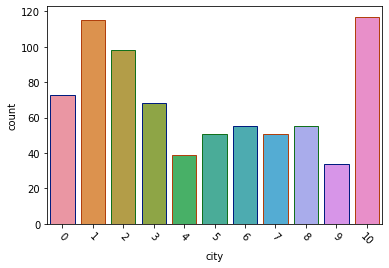

In [862]:
import seaborn as sns
sns.countplot(x='city',edgecolor=sns.color_palette("dark", 3), data=trimmed_df)

plt.xticks(rotation=-45)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text major ticklabel objects>)

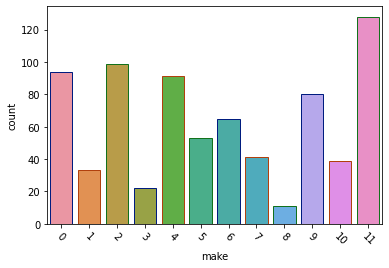

In [863]:
sns.countplot(x='make', edgecolor=sns.color_palette("dark", 3), data=trimmed_df)

plt.xticks(rotation=-45)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39]), <a list of 40 Text major ticklabel objects>)

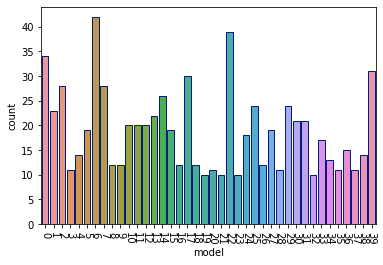

In [864]:
sns.countplot(x='model',edgecolor=sns.color_palette("dark", 1), data=trimmed_df)

plt.xticks(rotation=-90)

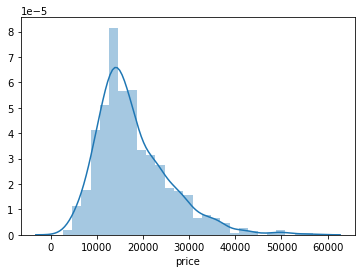

In [865]:
sns.distplot(trimmed_df['price'])

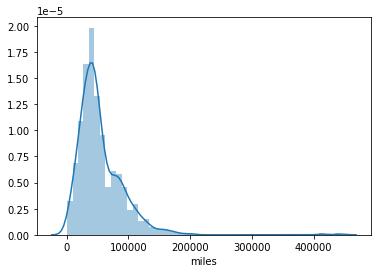

In [866]:
sns.distplot(trimmed_df['miles'])

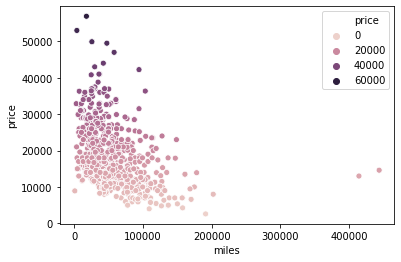

In [867]:
sns.scatterplot(x="miles", y="price", hue="price", data=trimmed_df)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 <a list of 11 Text major ticklabel objects>)

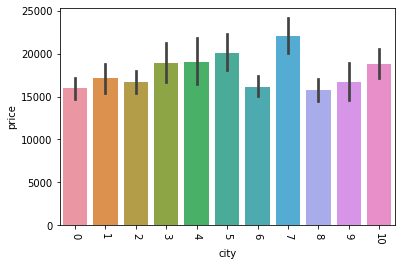

In [868]:
sns.barplot(x="city", y="price", data=trimmed_df)
plt.xticks(rotation=-90)

In [869]:
x = trimmed_df.loc[:, trimmed_df.columns != 'price'] 
x.shape
y = trimmed_df[['price']]
y.shape

(756, 1)

#### Created a stratified sample based on car model

In [870]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=42,  stratify=x['model'])

In [871]:
x_train.shape, x_test.shape, y_train.shape,y_test.shape

((604, 6), (152, 6), (604, 1), (152, 1))

### Linear Regression with Trimmed dataset

In [872]:
linreg1 = LinearRegression()

In [873]:
reg1 = linreg1.fit(x_train, y_train)

In [874]:
y_pred1 = reg1.predict(x_test)
y_pred1.shape

(152, 1)

In [875]:
r2_score = reg1.score(x_train,y_train)
print(r2_score*100,"%")

23.22620305652424 %


In [876]:
r2_score = reg1.score(x_test,y_test)
print(r2_score*100,"%") #Overfitting

32.10601287146321 %


### Random Forest with Trimmed dataset

In [941]:
model2 = RandomForestRegressor(n_estimators= 10
                              , warm_start=True)
model2.fit(x_train, y_train)

C:\Users\vaibh\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  This is separate from the ipykernel package so we can avoid doing imports until


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=True)

In [942]:
y_predict1 = model2.predict(x_test)

In [943]:
model2.score(x_train,y_train)*100

93.98888431695853

In [944]:
model2.score(x_test, y_test)*100

70.65196706242723

In [945]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_predict1))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predict1))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_predict1)))

Mean Absolute Error: 2787.2144736842106
Mean Squared Error: 15908754.505
Root Mean Squared Error: 3988.578005379862


### The MAE,  and  RMSE suggest that the predicted vs actual prices are off by 2700 and  3988 respectively

# ---End---